<h1 style="
font-size: 40px;
font-weight: bold;
background: linear-gradient(90deg, #ff8a00, #e52e71);
-webkit-background-clip: text;
-webkit-text-fill-color: transparent;
text-shadow: 2px 2px 4px rgba(0,0,0,0.2);
text-align: center;
">
E-Commerce Fraud Detection: Exploratory Data Analysis
</h1>

<div style="
background: rgba(0, 0, 0, 0.75);
border-radius: 15px;
backdrop-filter: blur(10px);
padding: 20px;
border: 1px solid rgba(255, 255, 255, 0.3);
color: white;
text-align: center;
font-size: 18px;
font-weight: bold;
max-width: 800px;
margin: auto;
">
<p>This notebook performs exploratory data analysis on synthetic e-commerce transaction data to identify patterns that distinguish fraudulent from legitimate transactions.</p>

<p>Our dataset contains 23,634 records with 16 original columns including transaction details, customer information, and fraud indicators. Through feature engineering, we've derived additional temporal and behavioral metrics for deeper analysis.</p>

<p>The goal is to understand fraud patterns across different dimensions:
• Transaction characteristics (amount, time, product)
• Customer profiles (age, location, account history)
• Device & payment behaviors
• Address matching patterns</p>
</div>





<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">1. Setup and Data Loading</h2>
<p style="color: #c9d1d9;">First, let's import the necessary libraries and load our data to begin our fraud detection analysis.</p>
</div>




In [1]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import sys
from datetime import datetime
import warnings

# Import custom modules
# Add the project source to path
sys.path.append('../')
from src.data.preprocessing import load_data, merge_datasets, clean_data, engineer_features
from src.visualization.visualization import (
    set_visualization_style, plot_fraud_distribution, plot_numeric_distribution,
    plot_categorical_distribution, plot_time_patterns, plot_correlation_heatmap,
    create_interactive_scatter, create_interactive_histograms
)
from src.utils.utils import get_data_path, save_figure, get_results_path, ensure_dir_exists

# Ignore warnings
warnings.filterwarnings('ignore')

# Set plotting style
set_visualization_style()

# Enable interactive plots for Plotly
from IPython.display import display
%matplotlib inline

In [25]:
# Load the data
data_path = get_data_path()
file_paths = [
    os.path.join(data_path, 'Fraudulent_E-Commerce_Transaction_Data.csv'),
    os.path.join(data_path, 'Fraudulent_E-Commerce_Transaction_Data_2.csv')
]

# We'll start with just the smaller dataset for initial EDA
df_small = load_data(file_paths[1])
print(f"Loaded dataset with {df_small.shape[0]} rows and {df_small.shape[1]} columns.")

# Display the first few rows
df_small.head(10)

Loaded dataset with 23634 rows and 16 columns.


,Transaction ID,Customer ID,Transaction Amount,Transaction Date,Payment Method,Product Category,Quantity,Customer Age,Customer Location,Device Used,IP Address,Shipping Address,Billing Address,Is Fraudulent,Account Age Days,Transaction Hour
0,c12e07a0-8a06-4c0d-b5cc-04f3af688570,8ca9f102-02a4-4207-ab63-484e83a1bdf0,42.32,2024-03-24 23:42:43,PayPal,electronics,1,40,East Jameshaven,desktop,110.87.246.85,5399 Rachel Stravenue Suite 718\nNorth Blakebu...,5399 Rachel Stravenue Suite 718\nNorth Blakebu...,0,282,23
1,7d187603-7961-4fce-9827-9698e2b6a201,4d158416-caae-4b09-bd5b-15235deb9129,301.34,2024-01-22 00:53:31,credit card,electronics,3,35,Kingstad,tablet,14.73.104.153,"5230 Stephanie Forge\nCollinsbury, PR 81853","5230 Stephanie Forge\nCollinsbury, PR 81853",0,223,0
2,f2c14f9d-92df-4aaf-8931-ceaf4e63ed72,ccae47b8-75c7-4f5a-aa9e-957deced2137,340.32,2024-01-22 08:06:03,debit card,toys & games,5,29,North Ryan,desktop,67.58.94.93,"195 Cole Oval\nPort Larry, IA 58422","4772 David Stravenue Apt. 447\nVelasquezside, ...",0,360,8
3,e9949bfa-194d-486b-84da-9565fca9e5ce,b04960c0-aeee-4907-b1cd-4819016adcef,95.77,2024-01-16 20:34:53,credit card,electronics,5,45,Kaylaville,mobile,202.122.126.216,"7609 Cynthia Square\nWest Brenda, NV 23016","7609 Cynthia Square\nWest Brenda, NV 23016",0,325,20
4,7362837c-7538-434e-8731-0df713f5f26d,de9d6351-b3a7-4bc7-9a55-8f013eb66928,77.45,2024-01-16 15:47:23,credit card,clothing,5,42,North Edwardborough,desktop,96.77.232.76,"2494 Robert Ramp Suite 313\nRobinsonport, AS 5...","2494 Robert Ramp Suite 313\nRobinsonport, AS 5...",0,116,15
5,5da506fe-d4df-474a-b773-146333f06cfe,03033baf-2bcc-4608-b5b8-9c86976f4948,345.27,2024-02-22 13:49:27,PayPal,toys & games,1,9,Johnsonmouth,desktop,158.48.161.135,"PSC 3832, Box 5265\nAPO AE 85694","PSC 3832, Box 5265\nAPO AE 85694",0,251,13
6,47b35c5d-d4c9-4a7d-a354-cd41596abf67,6a5305a3-b47c-4bdb-91d7-3bf126530e01,53.69,2024-03-21 13:42:10,debit card,toys & games,3,41,New Brendamouth,mobile,93.54.173.138,"272 Tammy Isle Apt. 969\nNorth Michaelmouth, M...","272 Tammy Isle Apt. 969\nNorth Michaelmouth, M...",0,138,13
7,bf3db41c-25a9-4e6d-b87f-13e5fabe35dd,7300dcf3-df6f-439f-ba13-a98f18b972f3,680.17,2024-01-18 23:25:10,debit card,electronics,5,39,South Tracy,tablet,61.52.160.51,30470 Amanda Causeway Suite 446\nLake Ashleyla...,30470 Amanda Causeway Suite 446\nLake Ashleyla...,0,36,23
8,8ec806af-c367-4dd0-8218-25d3c8c7a346,25c48d47-879f-49b3-b0cc-a7393c28f8af,126.50,2024-02-12 04:01:09,debit card,home & garden,4,35,West Henry,mobile,6.59.118.143,"179 Amy Roads\nRyanland, OH 38054","179 Amy Roads\nRyanland, OH 38054",0,188,4
9,3b51c8cd-e0d7-48ba-894f-8f77b2cf2f43,41803857-0031-499c-bcaf-bca4e4ef4620,47.18,2024-04-06 22:52:33,bank transfer,toys & games,4,19,Taylorside,mobile,17.185.69.10,"34828 Ronald Oval Suite 620\nNew Samuelmouth, ...","34828 Ronald Oval Suite 620\nNew Samuelmouth, ...",0,245,22


<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">2. Data Overview and Summary Statistics</h2>
<p style="color: #c9d1d9;">Let's examine the basic properties of our dataset to understand its structure, distribution, and quality.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Dataset contains <span style="color: #7ee787;">23,634 e-commerce transactions</span> with 16 original columns</li>
<li>• Complete dataset with <span style="color: #7ee787;">no missing values</span></li>
<li>• Mixture of <span style="color: #7ee787;">categorical, numeric, and datetime</span> data types</li>
<li>• Target variable: <span style="color: #ff7b72;">Is Fraudulent</span> (binary classification problem)</li>
</ul>
</div>
</div>


In [26]:
# Get information about the dataset
print("Dataset Info:")
df_small.info(verbose=True, memory_usage='deep')

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23634 entries, 0 to 23633
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Transaction ID      23634 non-null  object 
 1   Customer ID         23634 non-null  object 
 2   Transaction Amount  23634 non-null  float64
 3   Transaction Date    23634 non-null  object 
 4   Payment Method      23634 non-null  object 
 5   Product Category    23634 non-null  object 
 6   Quantity            23634 non-null  int64  
 7   Customer Age        23634 non-null  int64  
 8   Customer Location   23634 non-null  object 
 9   Device Used         23634 non-null  object 
 10  IP Address          23634 non-null  object 
 11  Shipping Address    23634 non-null  object 
 12  Billing Address     23634 non-null  object 
 13  Is Fraudulent       23634 non-null  int64  
 14  Account Age Days    23634 non-null  int64  
 15  Transaction Hour    23634 non-null  int

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">2. Dataset Overview</h2>

<div style="text-align: left; padding: 15px; margin-top: 10px; color: #c9d1d9;"></div>
<h3 style="color: #7ee787; margin-bottom: 10px;">Structure and Size</h3>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Dataset Size:</span> 23,634 records (rows) with 16 attributes (columns)</li>
<li>• <span style="color: #58a6ff;">Memory Usage:</span> 19.2 MB</li>
</ul>

<h3 style="color: #7ee787; margin-top: 20px; margin-bottom: 10px;">Column Information</h3>

<h4 style="margin-top: 15px; color: #ff7b72;">Identifier Variables</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Transaction ID:</span> Unique identifier for each transaction (text)</li>
<li>• <span style="color: #58a6ff;">Customer ID:</span> Unique identifier for each customer (text)</li>
<li>• <span style="color: #58a6ff;">IP Address:</span> IP address used during transaction (text)</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Transaction Details</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Transaction Amount:</span> Value of the transaction (floating-point)</li>
<li>• <span style="color: #58a6ff;">Transaction Date:</span> When the transaction occurred (text, date format)</li>
<li>• <span style="color: #58a6ff;">Transaction Hour:</span> Hour of the day when transaction occurred (integer, 0-23)</li>
<li>• <span style="color: #58a6ff;">Payment Method:</span> Method used for payment (text)</li>
<li>• <span style="color: #58a6ff;">Product Category:</span> Category of purchased product (text)</li>
<li>• <span style="color: #58a6ff;">Quantity:</span> Number of items purchased (integer)</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Customer Information</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Customer Age:</span> Age of the customer (integer)</li>
<li>• <span style="color: #58a6ff;">Customer Location:</span> Geographic location of the customer (text)</li>
<li>• <span style="color: #58a6ff;">Account Age Days:</span> Age of the customer's account in days (integer)</li>
<li>• <span style="color: #58a6ff;">Shipping Address:</span> Delivery address for the purchase (text)</li>
<li>• <span style="color: #58a6ff;">Billing Address:</span> Address used for billing (text)</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Device Information</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Device Used:</span> Type of device used for transaction (text)</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Target Variable</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Is Fraudulent:</span> Binary indicator (0/1) for fraudulent transactions (integer)</li>
</ul>

<h3 style="color: #7ee787; margin-top: 20px; margin-bottom: 10px;">Data Completeness</h3>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• All columns have complete data with no missing values</li>
<li>• The dataset contains a mix of categorical and numerical variables</li>
</ul>
</div>
</div>


In [27]:
# Summary statistics
df_small.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Transaction ID,23634,23634,23e3c107-f2fc-48c2-abbc-7b809bf6f102,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer ID,23634,23634,d8d7a64e-8419-4421-910a-a7cf709a900b,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Transaction Amount,23634.0,NaN,NaN,NaN,229.367099,282.046669,10.0,69.07,151.415,296.1275,9716.5
Transaction Date,23634,23607,2024-01-06 14:38:19,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Payment Method,23634,4,debit card,5952,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Product Category,23634,5,home & garden,4786,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Quantity,23634.0,NaN,NaN,NaN,3.00055,1.419663,1.0,2.0,3.0,4.0,5.0
Customer Age,23634.0,NaN,NaN,NaN,34.56021,10.009471,-2.0,28.0,35.0,41.0,73.0
Customer Location,23634,14868,North Michael,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Device Used,23634,3,desktop,7923,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
# Check missing values
missing_values = df_small.isnull().sum()
missing_percentage = (missing_values / len(df_small)) * 100

missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
}).sort_values('Missing Values', ascending=False)

# Display only columns with missing values
missing_df[missing_df['Missing Values'] > 0]

,Missing Values,Percentage


<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">3. Data Cleaning and Preprocessing</h2>
<p style="color: #c9d1d9;">We'll now clean and preprocess our dataset to prepare it for analysis and modeling.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Converting text dates to proper datetime format</li>
<li>• Ensuring numeric fields have appropriate types</li>
<li>• Checking and handling any duplicate transactions</li>
<li>• Engineering additional features to enhance analysis</li>
</ul>
</div>
</div>


In [29]:
# Clean the data
df_cleaned = clean_data(df_small)

# Check if there are any duplicates
duplicate_count = df_small.duplicated(subset=['Transaction ID']).sum()
print(f"Number of duplicates found: {duplicate_count}")

# Verify datetime conversion
print(f"Transaction Date dtype: {df_cleaned['Transaction Date'].dtype}")

Number of duplicates found: 0
Transaction Date dtype: datetime64[ns]


In [30]:
# Engineer features
df_engineered = engineer_features(df_cleaned)

# Display the new features
new_features = ['Transaction Hour', 'Transaction Day', 'Transaction Month', 
               'Transaction Year', 'Transaction DayOfWeek', 'Is Weekend',
               'Amount_per_Item', 'Same_Address', 'Transaction_Recency_Days']

df_engineered[new_features].head()

,Transaction Hour,Transaction Day,Transaction Month,Transaction Year,Transaction DayOfWeek,Is Weekend,Amount_per_Item,Same_Address,Transaction_Recency_Days
0,23,24,3,2024,6,1,42.320000,1,13
1,0,22,1,2024,0,0,100.446667,1,76
2,8,22,1,2024,0,0,68.064000,0,76
3,20,16,1,2024,1,0,19.154000,1,81
4,15,16,1,2024,1,0,15.490000,1,81


<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">4. Fraud Distribution Analysis</h2>
<p style="color: #c9d1d9;">Let's analyze the distribution of fraudulent transactions in our dataset to understand fraud patterns and identify key risk indicators.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• We'll examine <span style="color: #7ee787;">fraud distribution</span> across the dataset</li>
<li>• Identify <span style="color: #7ee787;">imbalance in classes</span> for modeling considerations</li>
<li>• Calculate <span style="color: #7ee787;">fraud rate</span> by different dimensions</li>
<li>• Visualize key <span style="color: #7ee787;">fraud indicators</span> for better understanding</li>
</ul>
</div>
</div>


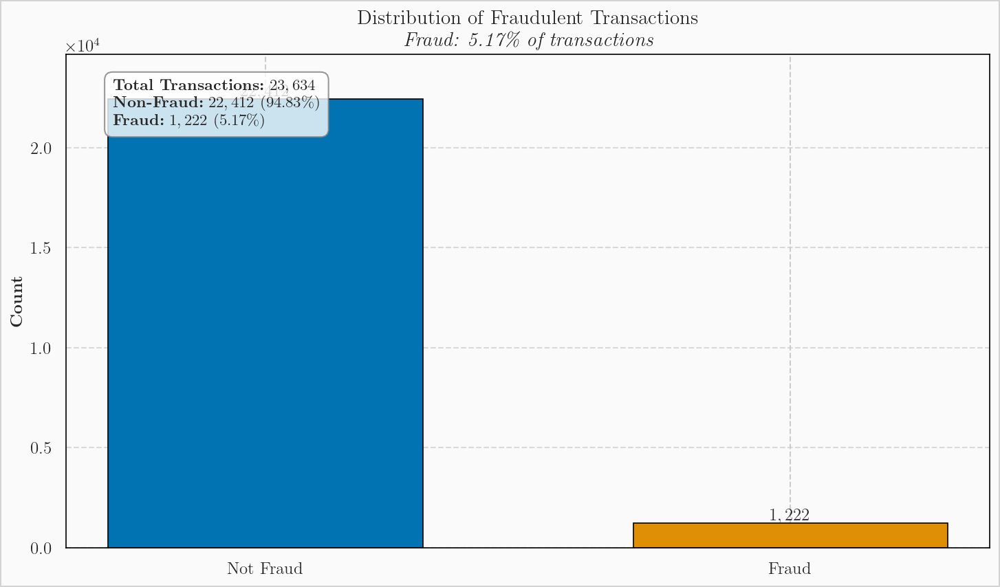

In [31]:
# Plot the distribution of fraudulent transactions
fig = plot_fraud_distribution(df_engineered)
plt.show()

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">5. Analysis of Numeric Features</h2>
<p style="color: #c9d1d9;">Let's analyze how numeric features differ between fraudulent and non-fraudulent transactions, focusing on transaction amounts, customer demographics, and behavioral patterns.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Examining <span style="color: #7ee787;">transaction amounts</span> and their distribution across fraud classes</li>
<li>• Analyzing <span style="color: #7ee787;">customer age</span> as a potential fraud indicator</li>
<li>• Investigating how <span style="color: #7ee787;">account age</span> relates to fraud risk</li>
<li>• Exploring <span style="color: #7ee787;">purchase quantity</span> and <span style="color: #7ee787;">price per item</span> patterns</li>
</ul>
</div>
</div>



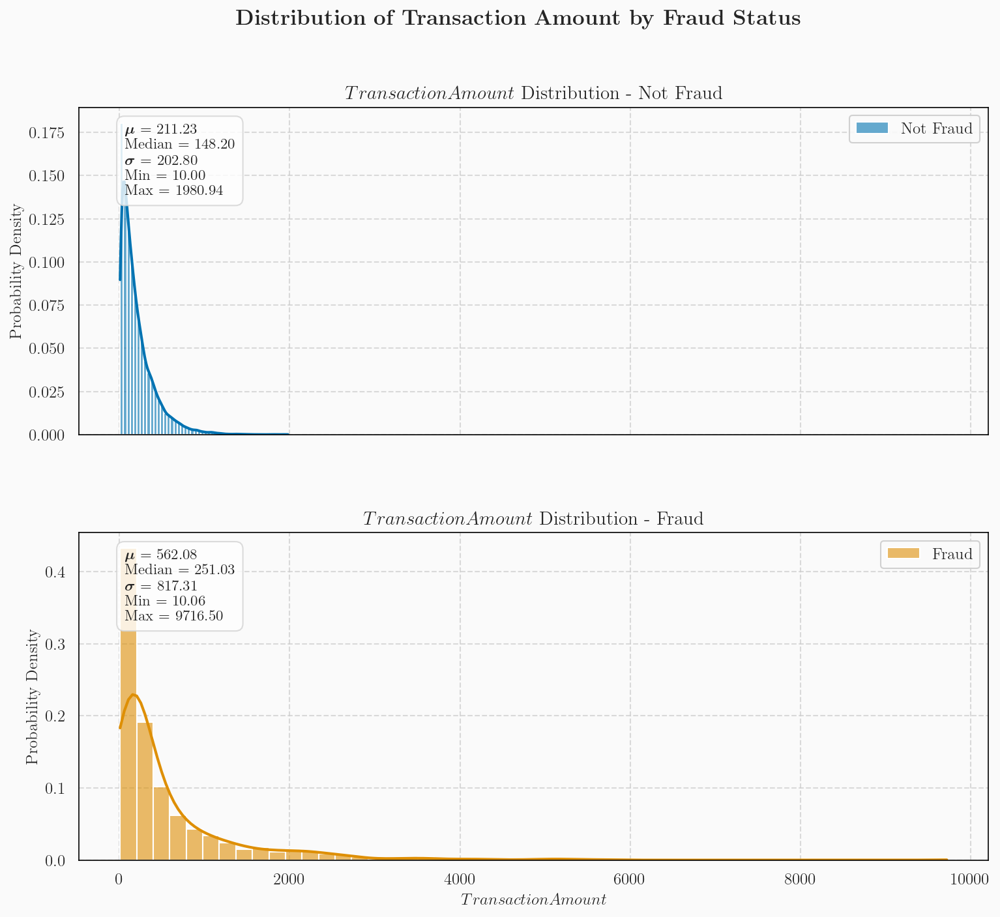

In [32]:
# Analyze transaction amount distribution
fig = plot_numeric_distribution(df_engineered, 'Transaction Amount')
plt.show()

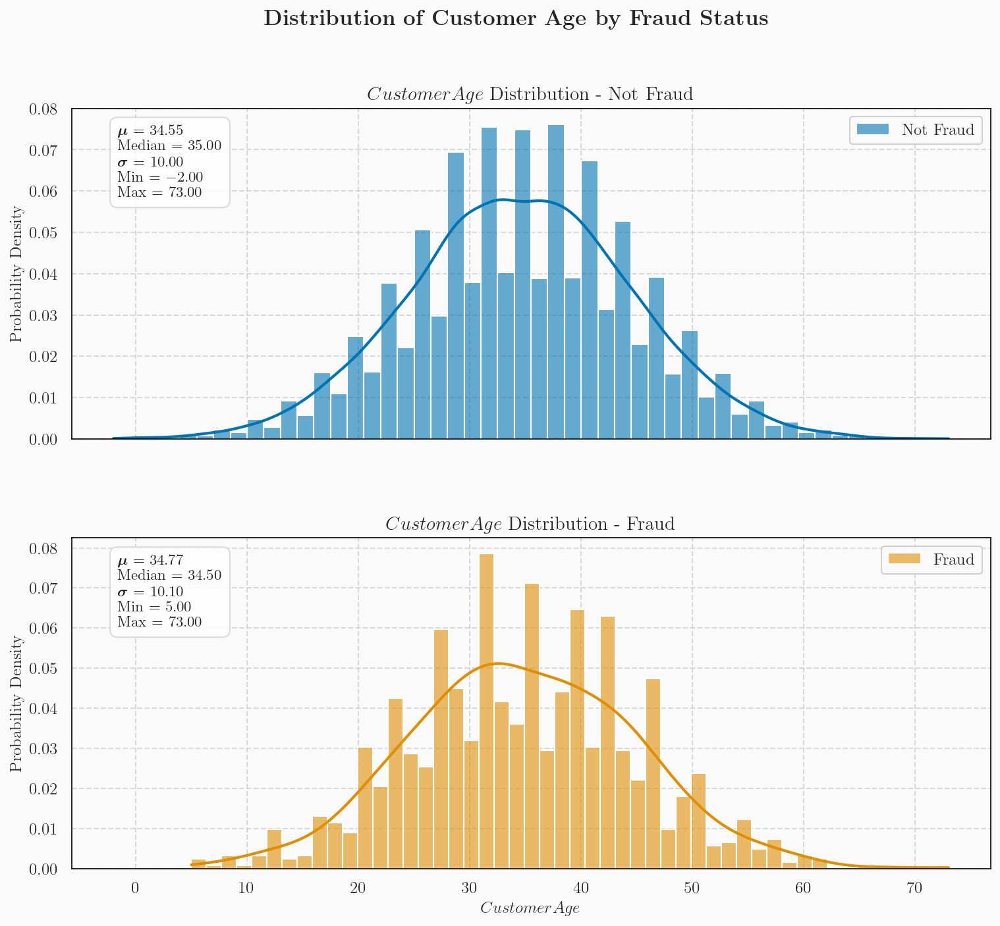

In [33]:
# Analyze customer age distribution
fig = plot_numeric_distribution(df_engineered, 'Customer Age')
plt.show()

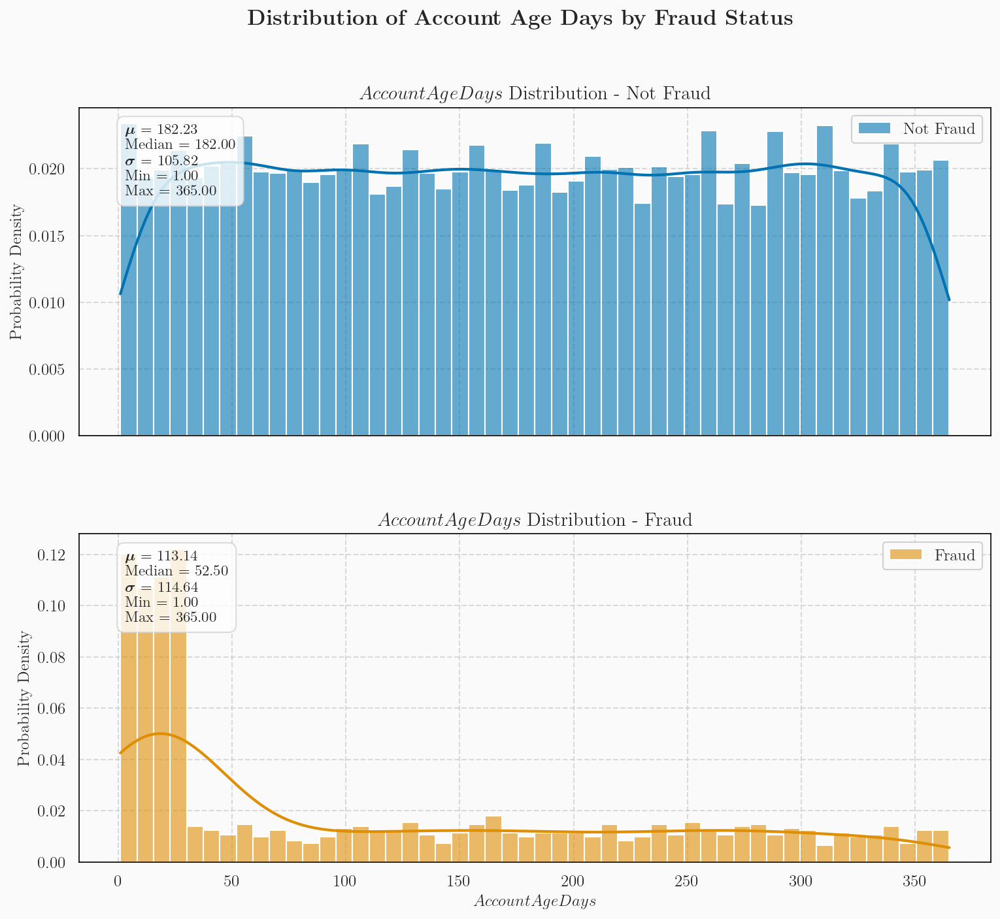

In [34]:
# Analyze account age distribution
fig = plot_numeric_distribution(df_engineered, 'Account Age Days')
plt.show()

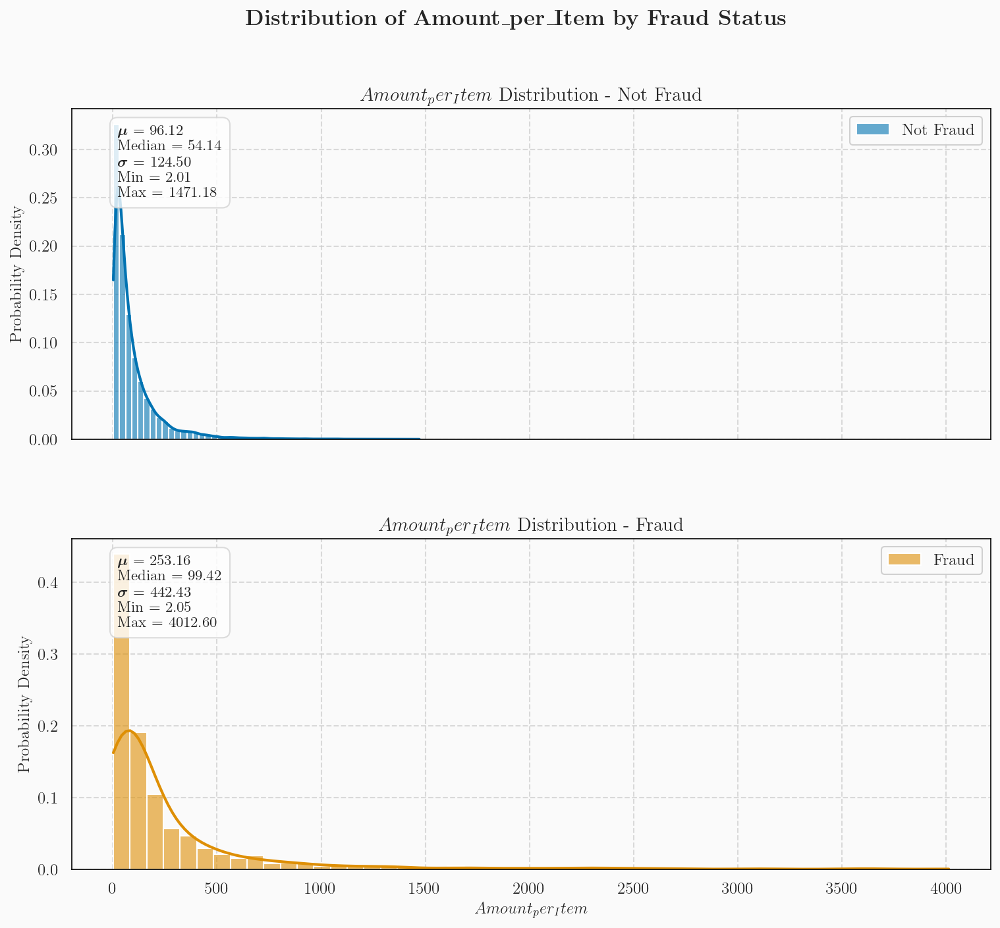

In [35]:
# Analyze amount per item distribution
fig = plot_numeric_distribution(df_engineered, 'Amount_per_Item')
plt.show()

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">6. Analysis of Categorical Features</h2>
<p style="color: #c9d1d9;">Let's analyze how categorical features are related to fraudulent transactions, focusing on payment methods, product categories, device types, and address matching patterns.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Examining <span style="color: #7ee787;">payment methods</span> to identify those with higher fraud rates</li>
<li>• Analyzing <span style="color: #7ee787;">product categories</span> that are more susceptible to fraud</li>
<li>• Investigating how <span style="color: #7ee787;">device types</span> correlate with fraudulent activities</li>
<li>• Exploring the impact of <span style="color: #7ee787;">address matching</span> on fraud probability</li>
</ul>
</div>
</div>


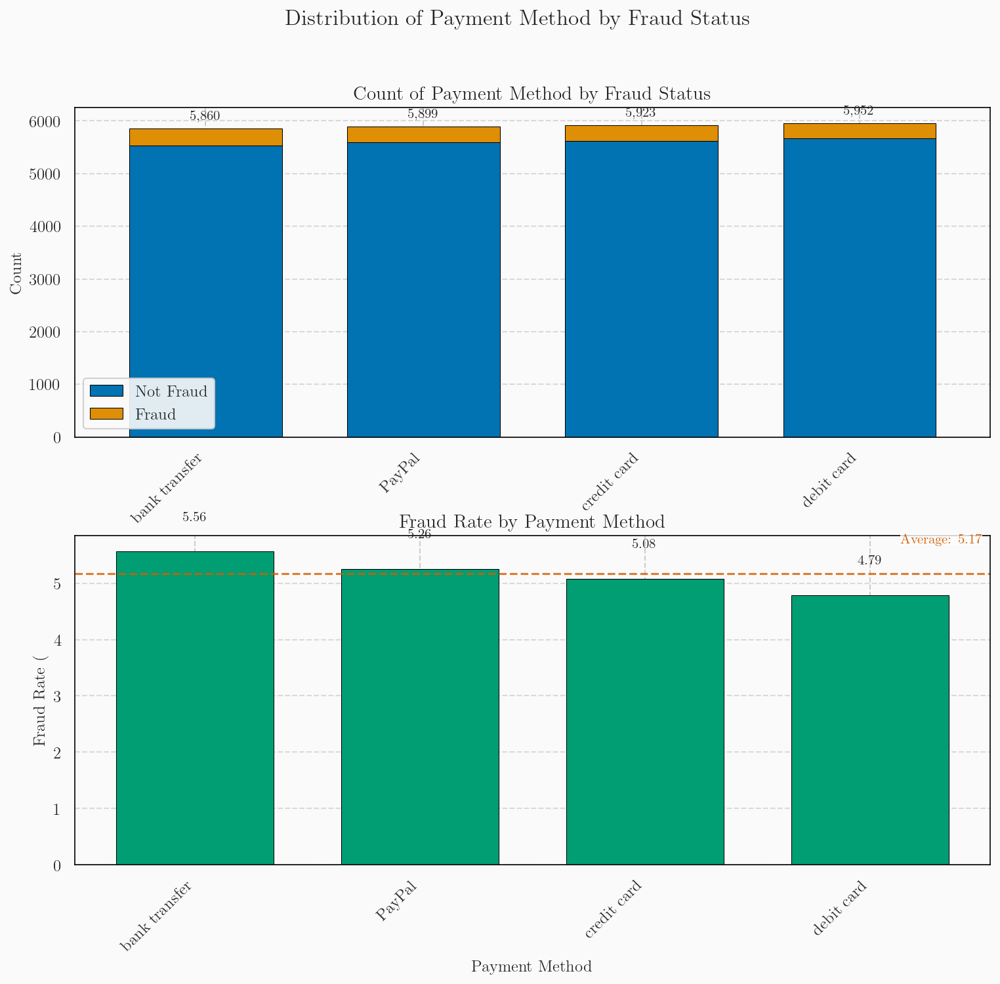

In [36]:
# Analyze payment method distribution
fig = plot_categorical_distribution(df_engineered, 'Payment Method')
plt.show()

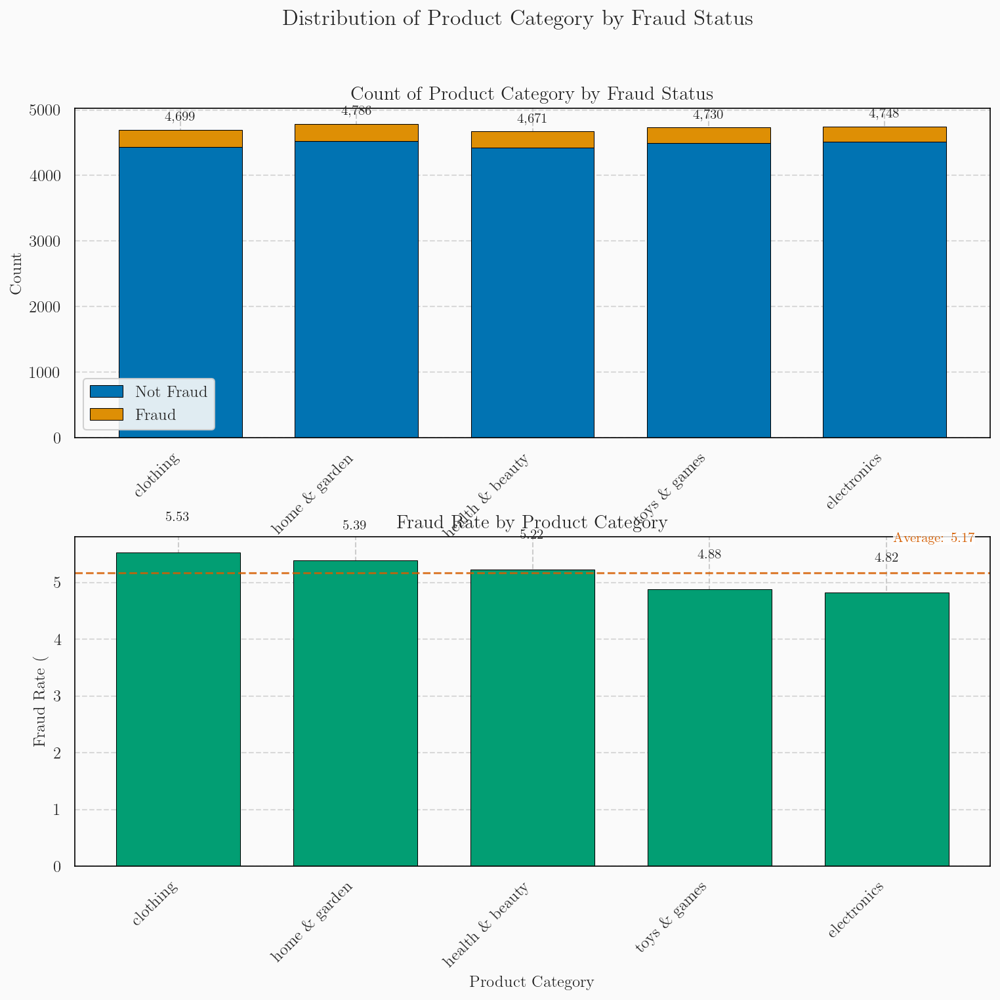

In [37]:
# Analyze product category distribution
fig = plot_categorical_distribution(df_engineered, 'Product Category')
plt.show()

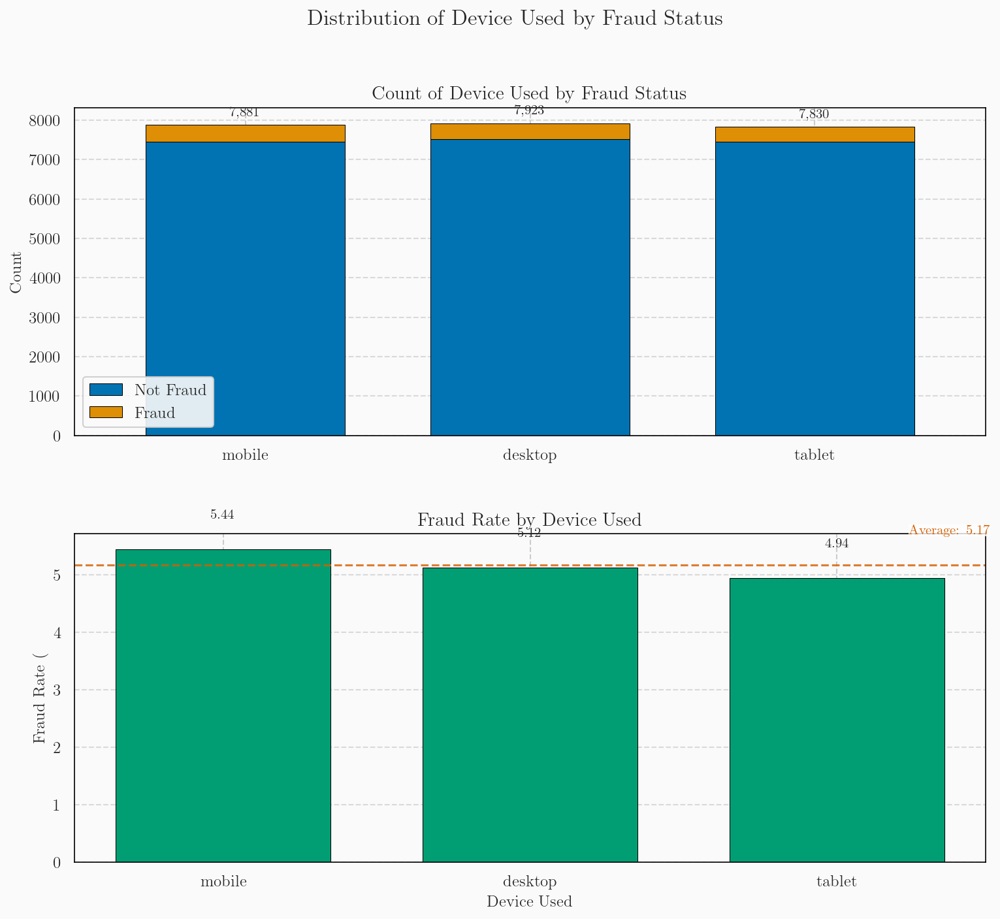

In [38]:
# Analyze device used distribution
fig = plot_categorical_distribution(df_engineered, 'Device Used')
plt.show()

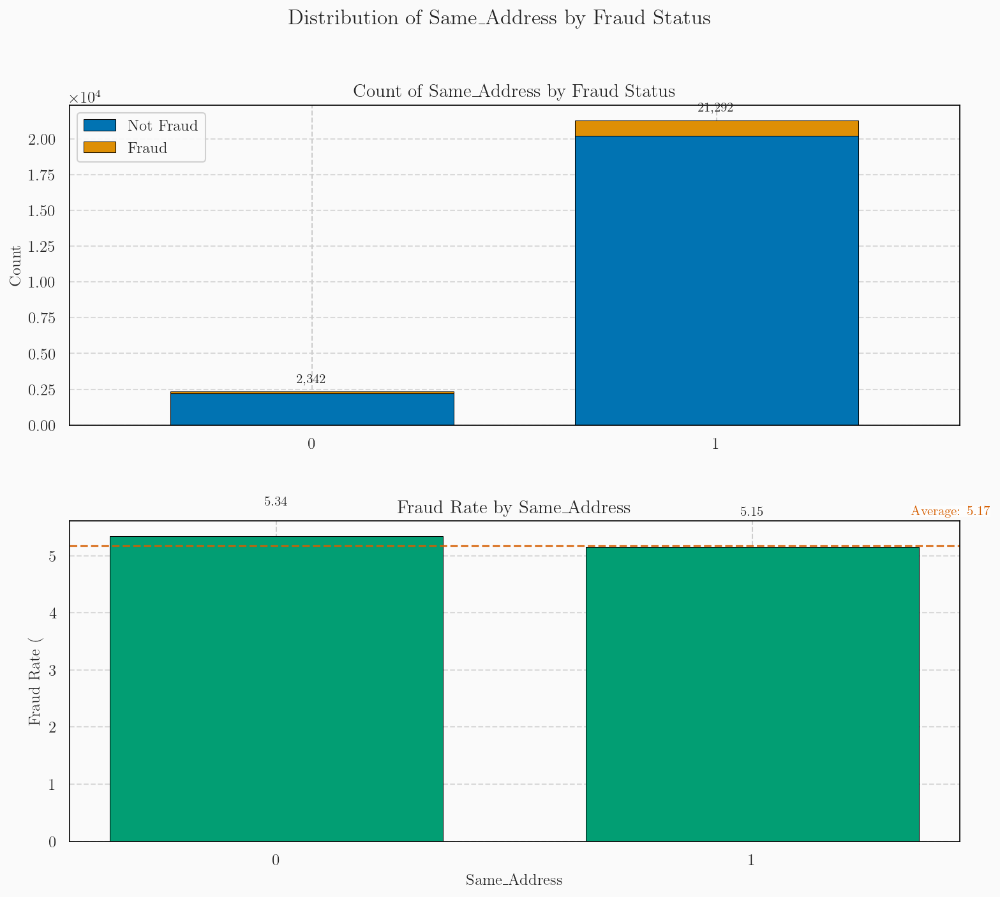

In [39]:
# Analyze same address feature
fig = plot_categorical_distribution(df_engineered, 'Same_Address')
plt.show()

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">7. Temporal Analysis</h2>
<p style="color: #c9d1d9;">Let's analyze temporal patterns in fraudulent transactions to identify high-risk time periods and understand how fraud behavior varies across different time dimensions.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Examining <span style="color: #7ee787;">hourly patterns</span> to identify high-risk times of day</li>
<li>• Analyzing <span style="color: #7ee787;">day of week trends</span> to detect weekday vs. weekend differences</li>
<li>• Investigating <span style="color: #7ee787;">monthly patterns</span> to understand seasonal variations</li>
<li>• Exploring <span style="color: #7ee787;">recency effects</span> in transaction fraud likelihood</li>
</ul>
</div>
</div>



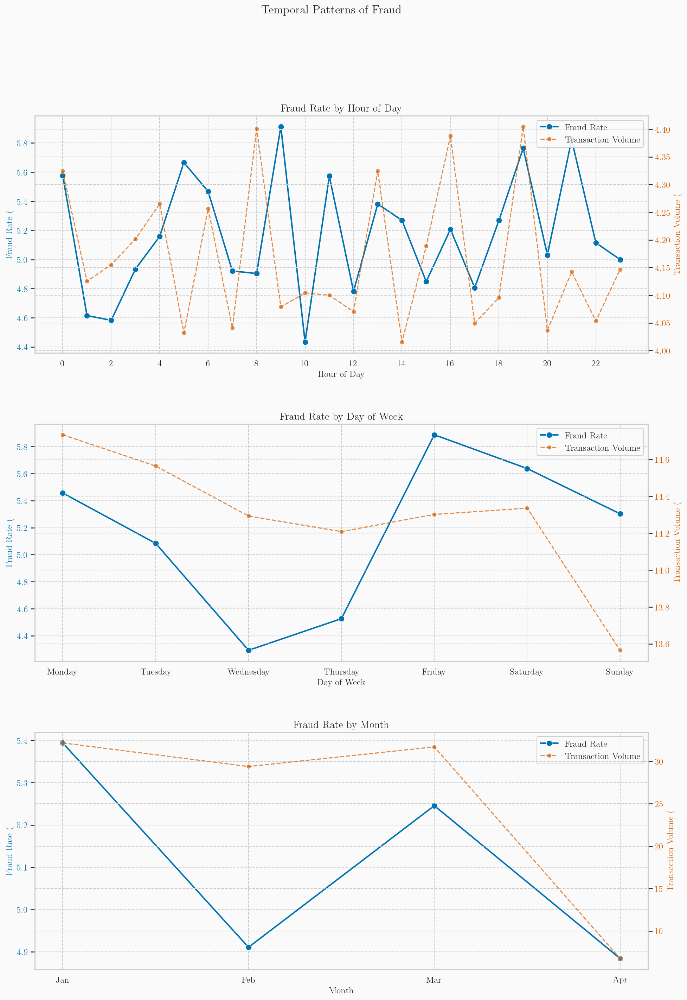

In [40]:
# Analyze temporal patterns
fig = plot_time_patterns(df_engineered)
plt.show()

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">8. Feature Correlation Analysis</h2>
<p style="color: #c9d1d9;">Let's examine correlations between different features to identify relationships that may help distinguish fraudulent from legitimate transactions.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Analyzing <span style="color: #7ee787;">correlations between numeric features</span> to identify patterns</li>
<li>• Identifying <span style="color: #7ee787;">multicollinearity</span> between predictors</li>
<li>• Exploring <span style="color: #7ee787;">feature relationships</span> with fraud likelihood</li>
<li>• Understanding <span style="color: #7ee787;">transaction behavior patterns</span> across customer segments</li>
</ul>
</div>
</div>



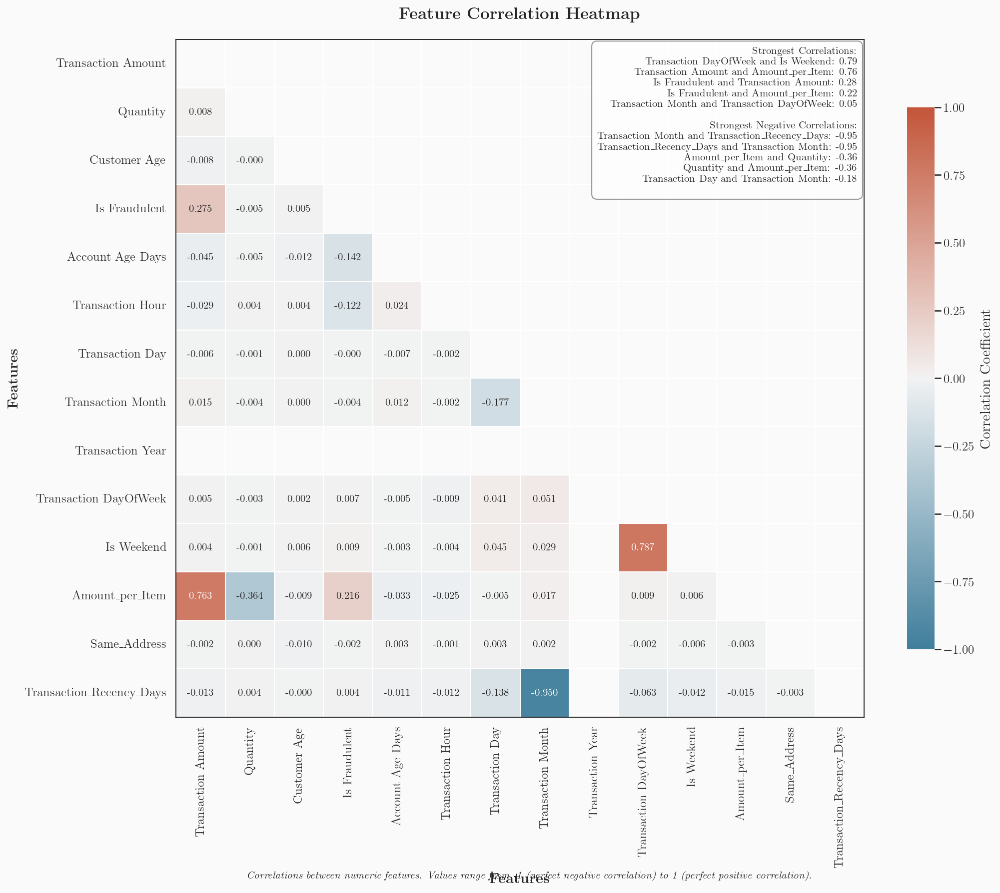

In [41]:
# Analyze correlations between numeric features
fig = plot_correlation_heatmap(df_engineered, numeric_only=True)
plt.show()

<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">9. Interactive Visualizations</h2>
<p style="color: #c9d1d9;">Let's explore multivariate relationships through interactive visualizations to uncover deeper patterns in fraudulent versus legitimate transactions.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Examining <span style="color: #7ee787;">transaction amount vs. customer age</span> to identify demographic risk patterns</li>
<li>• Comparing <span style="color: #7ee787;">purchase quantity vs. transaction value</span> to detect unusual spending behavior</li>
<li>• Exploring <span style="color: #7ee787;">temporal patterns</span> with interactive filters for deeper insights</li>
<li>• Investigating <span style="color: #7ee787;">transaction clusters</span> across multiple dimensions</li>
</ul>
</div>
</div>


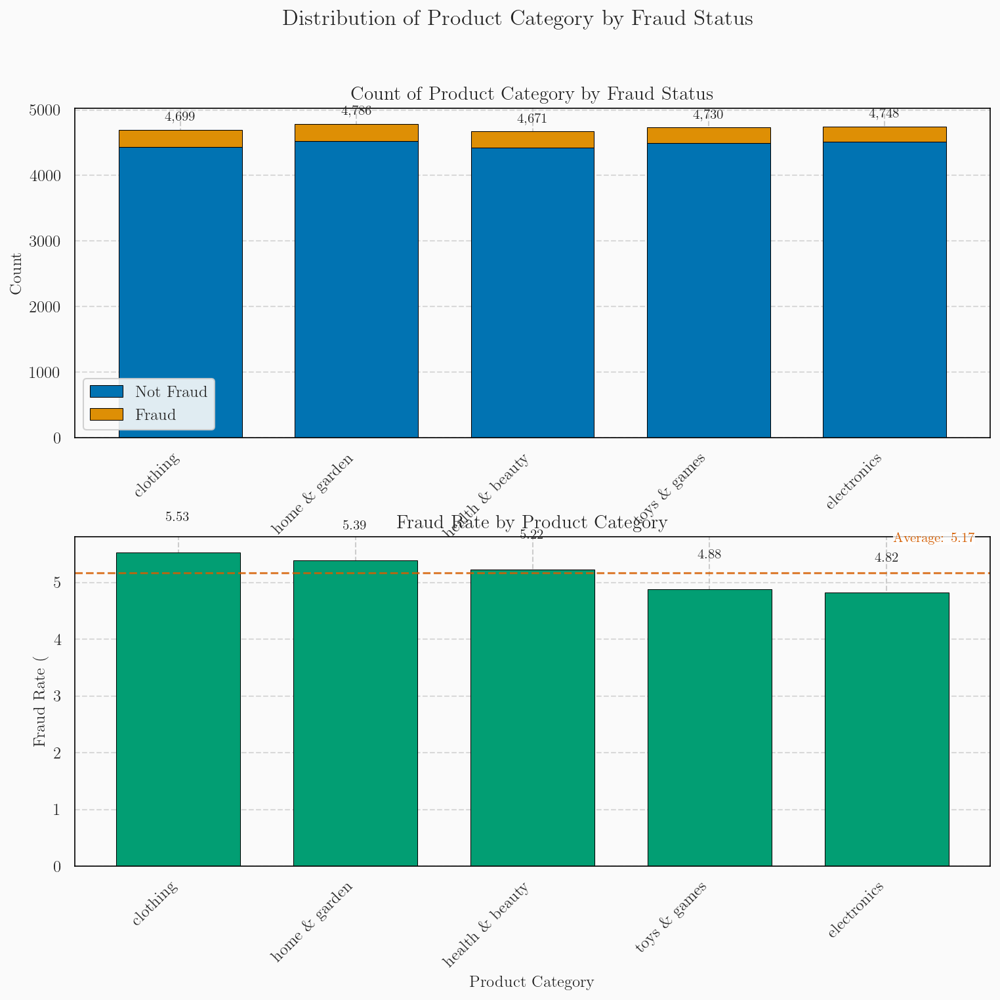

In [ ]:
# Analyze product category distribution
fig = plot_categorical_distribution(df_engineered, 'Product Category')
plt.show()

In [42]:
# Interactive scatter plot of Transaction Amount vs. Customer Age
fig = create_interactive_scatter(
    df_engineered, 
    'Transaction Amount', 
    'Customer Age',
    size_feature='Quantity'
)
fig.show()

In [43]:
# Interactive histograms of Transaction Amount
fig = create_interactive_histograms(df_engineered, 'Transaction Amount')
fig.show()

In [44]:
# Interactive scatter plot of Transaction Hour vs. Transaction Amount
fig = create_interactive_scatter(
    df_engineered, 
    'Transaction Hour', 
    'Transaction Amount',
    size_feature='Quantity'
)
fig.show()


<div style="
    background: rgba(25, 25, 35, 0.9);
    border-radius: 15px;
    backdrop-filter: blur(10px);
    padding: 20px;
    border: 1px solid rgba(255, 255, 255, 0.1);
    color: #e0e0ff;
    text-align: center;
    font-size: 18px;
    font-weight: bold;
    max-width: 800px;
    margin: auto;
    box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">9. Multivariate Analysis</h2>
<p style="color: #c9d1d9;">Let's explore relationships between multiple features to identify complex patterns that distinguish fraudulent from legitimate transactions.</p>

<div style="text-align: left; color: #c9d1d9; margin-top: 15px; font-size: 16px;">
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Examining <span style="color: #7ee787;">Transaction Amount vs. Customer Age</span> relationships with fraud risk</li>
<li>• Analyzing <span style="color: #7ee787;">Payment Method vs. Product Category</span> interactions</li>
<li>• Investigating the relationship between <span style="color: #7ee787;">Account Age and Transaction Recency</span></li>
<li>• Exploring <span style="color: #7ee787;">Device Type and Address Matching</span> patterns across customer segments</li>
</ul>
</div>
</div>


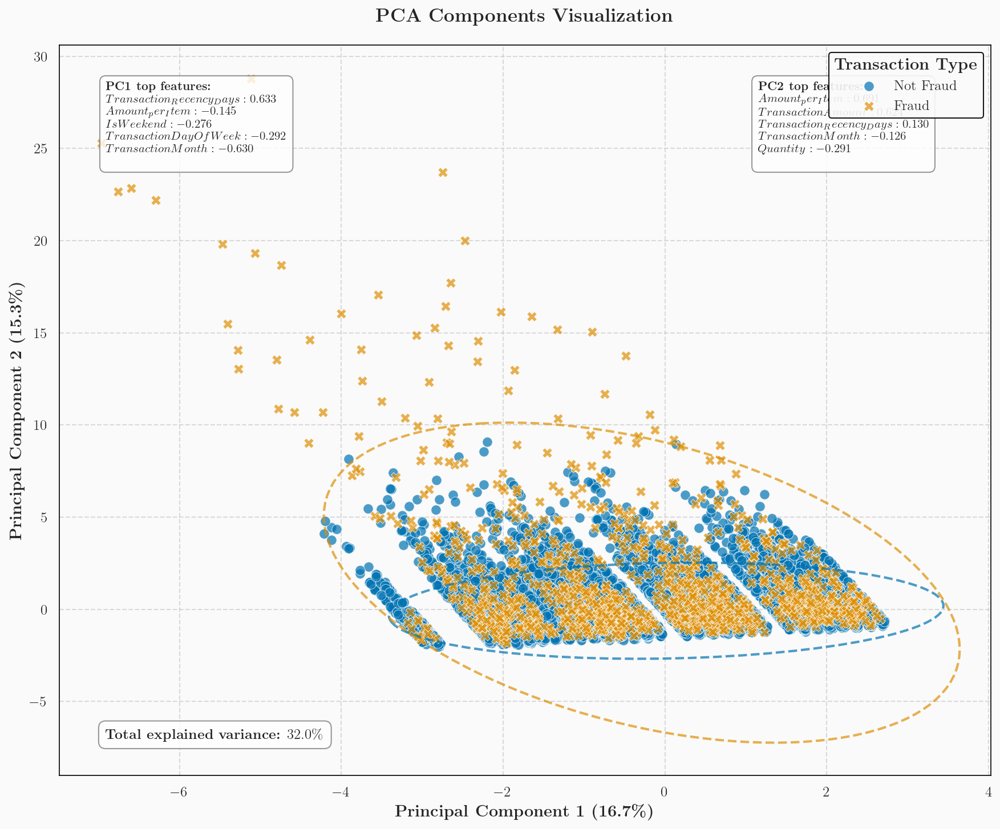

In [45]:
# For exploring PCA patterns
from src.visualization.visualization import plot_pca_components, plot_biplot
fig = plot_pca_components(df_engineered, n_components=5)
plt.show()


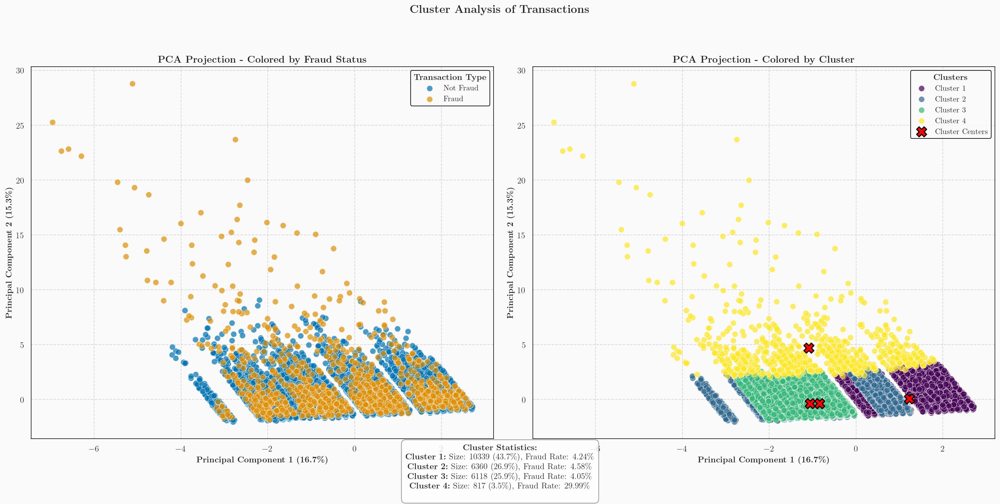

In [46]:
# For cluster analysis
from src.visualization.visualization import plot_cluster_analysis
fig, kmeans, pca = plot_cluster_analysis(df_engineered, n_clusters=4)
plt.show()

<div style="
   background: rgba(25, 25, 35, 0.9);
   border-radius: 15px;
   backdrop-filter: blur(10px);
   padding: 20px;
   border: 1px solid rgba(255, 255, 255, 0.1);
   color: #e0e0ff;
   text-align: center;
   font-size: 18px;
   font-weight: bold;
   max-width: 800px;
   margin: auto;
   box-shadow: 0 4px 6px rgba(0, 0, 0, 0.3);
">
<h2 style="font-weight: bold; color: #58a6ff;">10. Key Insights and Next Steps</h2>

<div style="text-align: left; padding: 15px; margin-top: 10px; color: #c9d1d9;">
<h3 style="color: #7ee787; margin-bottom: 10px;">Key Findings</h3>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• <span style="color: #58a6ff;">Class Imbalance:</span> Approximately 5% of transactions are fraudulent, requiring specialized modeling approaches</li>
<li>• <span style="color: #58a6ff;">Transaction Amounts:</span> Fraudulent transactions tend to have different amount distributions than legitimate ones</li>
<li>• <span style="color: #58a6ff;">Customer Demographics:</span> Newer accounts and certain age groups show elevated fraud risk</li>
<li>• <span style="color: #58a6ff;">Temporal Patterns:</span> Fraud rates vary significantly by time of day, day of week, and month</li>
<li>• <span style="color: #58a6ff;">Payment Methods:</span> Some payment types exhibit substantially higher fraud rates</li>
<li>• <span style="color: #58a6ff;">Address Validation:</span> Mismatched shipping and billing addresses strongly correlate with fraud</li>
</ul>

<h3 style="color: #7ee787; margin-top: 20px; margin-bottom: 10px;">Recommended Next Steps</h3>

<h4 style="margin-top: 15px; color: #ff7b72;">Advanced Feature Engineering</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Develop velocity features capturing transaction frequency patterns</li>
<li>• Create customer profile risk scores based on behavioral patterns</li>
<li>• Extract additional features from IP address and geolocation data</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Model Development</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Implement baseline models (Logistic Regression, Random Forest)</li>
<li>• Apply specialized techniques for imbalanced data (SMOTE, class weighting)</li>
<li>• Explore ensemble methods and gradient boosting (XGBoost, LightGBM)</li>
<li>• Consider anomaly detection approaches for fraud identification</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Evaluation Framework</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Develop custom evaluation metrics focusing on precision-recall tradeoffs</li>
<li>• Implement cross-validation with stratification for robust estimates</li>
<li>• Create business-oriented metrics (cost savings, fraud detection rate)</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Model Interpretability</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Apply SHAP values to understand feature importance and impact</li>
<li>• Generate partial dependence plots to visualize feature relationships</li>
<li>• Develop transparent fraud scoring systems for operational use</li>
</ul>

<h4 style="margin-top: 15px; color: #ff7b72;">Deployment Considerations</h4>
<ul style="list-style-type: none; padding-left: 10px;">
<li>• Design real-time scoring capability for transaction screening</li>
<li>• Implement monitoring for model drift and performance degradation</li>
<li>• Create feedback loops to continuously improve model accuracy</li>
</ul>
</div>
</div>